
The Following Final Project is for Predictive Analytics, STAT 388 at Loyola University Chicago for Fall 2020 semester, created by Emrys Kaya and Daniella Pombo.

The Project is based on the Kaggle competition: https://www.kaggle.com/c/lish-moa/overview/description and uploaded to https://www.kaggle.com/statsinthewild/wtfff.

The goal is to create a successful ML algorithm that produces reliable, sufficient multi-label predictions of the Mechanism of Actoin (MoA) responses per the given observation in the input data. 

Note: data was acquired via https://www.kaggle.com/c/lish-moa/overview/description.

The Project Completion Date is December 7th, 2020 By Emrys Kaya and Daniella Pombo.

The Documentation and Report on the methodologies, algorithms and conclusions may be found at https://docs.google.com/document/d/1QS6x2zkkOgYYH52KAwP86_VctOX9jOkq-YZfyNqBDSQ/edit?usp=sharing.

If there are any issues accessing the above links, documentation and or code please contact dpombo@luc.edu or mkaya@luc.edu


Required Libraries

In [66]:
#Data structures and statistical+mathematical packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

##Estimators
from sklearn.neighbors import KNeighborsClassifier
from sklearn import linear_model
from sklearn.linear_model import RidgeClassifier
from sklearn.decomposition import TruncatedSVD
from sklearn.multioutput import MultiOutputClassifier
from sklearn.multioutput import ClassifierChain

In [67]:
#Preprocessing Packages
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer 

### Data Set

Data Files: 

x_train = "train_features.csv" 
    Size: (23814, 876)
    Description: Contains the train set observations and associated features. 
    
x_test = "test_features.csv"
    Size: (3982, 876)
    Description: Contains the test set observations and associated features. Is used to create the prediction submission file.

y_train = "train_targets_scored.csv"
    Size: (23814, 207)
    Description: Train data set's labels
    
extra = "train_targets_nonscored.csv"
    Size: (23814, 403)
    Description: Is an additional data set that is not used for the end result but for more information on understanding the data.
    
    
sample=  "sample_submission.csv"
    Size: (3982, 207)
    Description: Exemplitory file for submission format of the predictions created from the test data set.

Notes. 

        - 'sig_id' identifier for the observations (samples_
        - '/g-*/' within the attribute name indicates the given attribute is a gene expression data attribute. 
        - '/c-*/' within the attribute name indicates the given attribute is a cell viablity data attribute. 
        - Data set categorical variables are 'cp_type', 'cp_time' and 'cp_dose'
            - 'cp_type' attribute indicates whether an observation was treated with 'cp_vehicle' or 'ctrl_vehicle', which has no MoA's.
            - 'cp_time' attribute describes treatment duration with categorical options of 24, 48 and 72 hours.
            - 'cp_dose' attribute describes the dosage which may either be low or high.
        - All other attributes are qualitiative!

Features: quantity of 876 features per observation

['sig_id', 'cp_type', 'cp_time', 'cp_dose', 'g-0', 'g-1', 'g-2', 'g-3', 'g-4', 'g-5', 'g-6', 'g-7', 'g-8', 'g-9', 'g-10', 'g-11', 'g-12', 'g-13', 'g-14', 'g-15', 'g-16', 'g-17', 'g-18', 'g-19', 'g-20', 'g-21', 'g-22', 'g-23', 'g-24', 'g-25', 'g-26', 'g-27', 'g-28', 'g-29', 'g-30', 'g-31', 'g-32', 'g-33', 'g-34', 'g-35', 'g-36', 'g-37', 'g-38', 'g-39', 'g-40', 'g-41', 'g-42', 'g-43', 'g-44', 'g-45', 'g-46', 'g-47', 'g-48', 'g-49', 'g-50', 'g-51', 'g-52', 'g-53', 'g-54', 'g-55', 'g-56', 'g-57', 'g-58', 'g-59', 'g-60', 'g-61', 'g-62', 'g-63', 'g-64', 'g-65', 'g-66', 'g-67', 'g-68', 'g-69', 'g-70', 'g-71', 'g-72', 'g-73', 'g-74', 'g-75', 'g-76', 'g-77', 'g-78', 'g-79', 'g-80', 'g-81', 'g-82', 'g-83', 'g-84', 'g-85', 'g-86', 'g-87', 'g-88', 'g-89', 'g-90', 'g-91', 'g-92', 'g-93', 'g-94', 'g-95', 'g-96', 'g-97', 'g-98', 'g-99', 'g-100', 'g-101', 'g-102', 'g-103', 'g-104', 'g-105', 'g-106', 'g-107', 'g-108', 'g-109', 'g-110', 'g-111', 'g-112', 'g-113', 'g-114', 'g-115', 'g-116', 'g-117', 'g-118', 'g-119', 'g-120', 'g-121', 'g-122', 'g-123', 'g-124', 'g-125', 'g-126', 'g-127', 'g-128', 'g-129', 'g-130', 'g-131', 'g-132', 'g-133', 'g-134', 'g-135', 'g-136', 'g-137', 'g-138', 'g-139', 'g-140', 'g-141', 'g-142', 'g-143', 'g-144', 'g-145', 'g-146', 'g-147', 'g-148', 'g-149', 'g-150', 'g-151', 'g-152', 'g-153', 'g-154', 'g-155', 'g-156', 'g-157', 'g-158', 'g-159', 'g-160', 'g-161', 'g-162', 'g-163', 'g-164', 'g-165', 'g-166', 'g-167', 'g-168', 'g-169', 'g-170', 'g-171', 'g-172', 'g-173', 'g-174', 'g-175', 'g-176', 'g-177', 'g-178', 'g-179', 'g-180', 'g-181', 'g-182', 'g-183', 'g-184', 'g-185', 'g-186', 'g-187', 'g-188', 'g-189', 'g-190', 'g-191', 'g-192', 'g-193', 'g-194', 'g-195', 'g-196', 'g-197', 'g-198', 'g-199', 'g-200', 'g-201', 'g-202', 'g-203', 'g-204', 'g-205', 'g-206', 'g-207', 'g-208', 'g-209', 'g-210', 'g-211', 'g-212', 'g-213', 'g-214', 'g-215', 'g-216', 'g-217', 'g-218', 'g-219', 'g-220', 'g-221', 'g-222', 'g-223', 'g-224', 'g-225', 'g-226', 'g-227', 'g-228', 'g-229', 'g-230', 'g-231', 'g-232', 'g-233', 'g-234', 'g-235', 'g-236', 'g-237', 'g-238', 'g-239', 'g-240', 'g-241', 'g-242', 'g-243', 'g-244', 'g-245', 'g-246', 'g-247', 'g-248', 'g-249', 'g-250', 'g-251', 'g-252', 'g-253', 'g-254', 'g-255', 'g-256', 'g-257', 'g-258', 'g-259', 'g-260', 'g-261', 'g-262', 'g-263', 'g-264', 'g-265', 'g-266', 'g-267', 'g-268', 'g-269', 'g-270', 'g-271', 'g-272', 'g-273', 'g-274', 'g-275', 'g-276', 'g-277', 'g-278', 'g-279', 'g-280', 'g-281', 'g-282', 'g-283', 'g-284', 'g-285', 'g-286', 'g-287', 'g-288', 'g-289', 'g-290', 'g-291', 'g-292', 'g-293', 'g-294', 'g-295', 'g-296', 'g-297', 'g-298', 'g-299', 'g-300', 'g-301', 'g-302', 'g-303', 'g-304', 'g-305', 'g-306', 'g-307', 'g-308', 'g-309', 'g-310', 'g-311', 'g-312', 'g-313', 'g-314', 'g-315', 'g-316', 'g-317', 'g-318', 'g-319', 'g-320', 'g-321', 'g-322', 'g-323', 'g-324', 'g-325', 'g-326', 'g-327', 'g-328', 'g-329', 'g-330', 'g-331', 'g-332', 'g-333', 'g-334', 'g-335', 'g-336', 'g-337', 'g-338', 'g-339', 'g-340', 'g-341', 'g-342', 'g-343', 'g-344', 'g-345', 'g-346', 'g-347', 'g-348', 'g-349', 'g-350', 'g-351', 'g-352', 'g-353', 'g-354', 'g-355', 'g-356', 'g-357', 'g-358', 'g-359', 'g-360', 'g-361', 'g-362', 'g-363', 'g-364', 'g-365', 'g-366', 'g-367', 'g-368', 'g-369', 'g-370', 'g-371', 'g-372', 'g-373', 'g-374', 'g-375', 'g-376', 'g-377', 'g-378', 'g-379', 'g-380', 'g-381', 'g-382', 'g-383', 'g-384', 'g-385', 'g-386', 'g-387', 'g-388', 'g-389', 'g-390', 'g-391', 'g-392', 'g-393', 'g-394', 'g-395', 'g-396', 'g-397', 'g-398', 'g-399', 'g-400', 'g-401', 'g-402', 'g-403', 'g-404', 'g-405', 'g-406', 'g-407', 'g-408', 'g-409', 'g-410', 'g-411', 'g-412', 'g-413', 'g-414', 'g-415', 'g-416', 'g-417', 'g-418', 'g-419', 'g-420', 'g-421', 'g-422', 'g-423', 'g-424', 'g-425', 'g-426', 'g-427', 'g-428', 'g-429', 'g-430', 'g-431', 'g-432', 'g-433', 'g-434', 'g-435', 'g-436', 'g-437', 'g-438', 'g-439', 'g-440', 'g-441', 'g-442', 'g-443', 'g-444', 'g-445', 'g-446', 'g-447', 'g-448', 'g-449', 'g-450', 'g-451', 'g-452', 'g-453', 'g-454', 'g-455', 'g-456', 'g-457', 'g-458', 'g-459', 'g-460', 'g-461', 'g-462', 'g-463', 'g-464', 'g-465', 'g-466', 'g-467', 'g-468', 'g-469', 'g-470', 'g-471', 'g-472', 'g-473', 'g-474', 'g-475', 'g-476', 'g-477', 'g-478', 'g-479', 'g-480', 'g-481', 'g-482', 'g-483', 'g-484', 'g-485', 'g-486', 'g-487', 'g-488', 'g-489', 'g-490', 'g-491', 'g-492', 'g-493', 'g-494', 'g-495', 'g-496', 'g-497', 'g-498', 'g-499', 'g-500', 'g-501', 'g-502', 'g-503', 'g-504', 'g-505', 'g-506', 'g-507', 'g-508', 'g-509', 'g-510', 'g-511', 'g-512', 'g-513', 'g-514', 'g-515', 'g-516', 'g-517', 'g-518', 'g-519', 'g-520', 'g-521', 'g-522', 'g-523', 'g-524', 'g-525', 'g-526', 'g-527', 'g-528', 'g-529', 'g-530', 'g-531', 'g-532', 'g-533', 'g-534', 'g-535', 'g-536', 'g-537', 'g-538', 'g-539', 'g-540', 'g-541', 'g-542', 'g-543', 'g-544', 'g-545', 'g-546', 'g-547', 'g-548', 'g-549', 'g-550', 'g-551', 'g-552', 'g-553', 'g-554', 'g-555', 'g-556', 'g-557', 'g-558', 'g-559', 'g-560', 'g-561', 'g-562', 'g-563', 'g-564', 'g-565', 'g-566', 'g-567', 'g-568', 'g-569', 'g-570', 'g-571', 'g-572', 'g-573', 'g-574', 'g-575', 'g-576', 'g-577', 'g-578', 'g-579', 'g-580', 'g-581', 'g-582', 'g-583', 'g-584', 'g-585', 'g-586', 'g-587', 'g-588', 'g-589', 'g-590', 'g-591', 'g-592', 'g-593', 'g-594', 'g-595', 'g-596', 'g-597', 'g-598', 'g-599', 'g-600', 'g-601', 'g-602', 'g-603', 'g-604', 'g-605', 'g-606', 'g-607', 'g-608', 'g-609', 'g-610', 'g-611', 'g-612', 'g-613', 'g-614', 'g-615', 'g-616', 'g-617', 'g-618', 'g-619', 'g-620', 'g-621', 'g-622', 'g-623', 'g-624', 'g-625', 'g-626', 'g-627', 'g-628', 'g-629', 'g-630', 'g-631', 'g-632', 'g-633', 'g-634', 'g-635', 'g-636', 'g-637', 'g-638', 'g-639', 'g-640', 'g-641', 'g-642', 'g-643', 'g-644', 'g-645', 'g-646', 'g-647', 'g-648', 'g-649', 'g-650', 'g-651', 'g-652', 'g-653', 'g-654', 'g-655', 'g-656', 'g-657', 'g-658', 'g-659', 'g-660', 'g-661', 'g-662', 'g-663', 'g-664', 'g-665', 'g-666', 'g-667', 'g-668', 'g-669', 'g-670', 'g-671', 'g-672', 'g-673', 'g-674', 'g-675', 'g-676', 'g-677', 'g-678', 'g-679', 'g-680', 'g-681', 'g-682', 'g-683', 'g-684', 'g-685', 'g-686', 'g-687', 'g-688', 'g-689', 'g-690', 'g-691', 'g-692', 'g-693', 'g-694', 'g-695', 'g-696', 'g-697', 'g-698', 'g-699', 'g-700', 'g-701', 'g-702', 'g-703', 'g-704', 'g-705', 'g-706', 'g-707', 'g-708', 'g-709', 'g-710', 'g-711', 'g-712', 'g-713', 'g-714', 'g-715', 'g-716', 'g-717', 'g-718', 'g-719', 'g-720', 'g-721', 'g-722', 'g-723', 'g-724', 'g-725', 'g-726', 'g-727', 'g-728', 'g-729', 'g-730', 'g-731', 'g-732', 'g-733', 'g-734', 'g-735', 'g-736', 'g-737', 'g-738', 'g-739', 'g-740', 'g-741', 'g-742', 'g-743', 'g-744', 'g-745', 'g-746', 'g-747', 'g-748', 'g-749', 'g-750', 'g-751', 'g-752', 'g-753', 'g-754', 'g-755', 'g-756', 'g-757', 'g-758', 'g-759', 'g-760', 'g-761', 'g-762', 'g-763', 'g-764', 'g-765', 'g-766', 'g-767', 'g-768', 'g-769', 'g-770', 'g-771', 'c-0', 'c-1', 'c-2', 'c-3', 'c-4', 'c-5', 'c-6', 'c-7', 'c-8', 'c-9', 'c-10', 'c-11', 'c-12', 'c-13', 'c-14', 'c-15', 'c-16', 'c-17', 'c-18', 'c-19', 'c-20', 'c-21', 'c-22', 'c-23', 'c-24', 'c-25', 'c-26', 'c-27', 'c-28', 'c-29', 'c-30', 'c-31', 'c-32', 'c-33', 'c-34', 'c-35', 'c-36', 'c-37', 'c-38', 'c-39', 'c-40', 'c-41', 'c-42', 'c-43', 'c-44', 'c-45', 'c-46', 'c-47', 'c-48', 'c-49', 'c-50', 'c-51', 'c-52', 'c-53', 'c-54', 'c-55', 'c-56', 'c-57', 'c-58', 'c-59', 'c-60', 'c-61', 'c-62', 'c-63', 'c-64', 'c-65', 'c-66', 'c-67', 'c-68', 'c-69', 'c-70', 'c-71', 'c-72', 'c-73', 'c-74', 'c-75', 'c-76', 'c-77', 'c-78', 'c-79', 'c-80', 'c-81', 'c-82', 'c-83', 'c-84', 'c-85', 'c-86', 'c-87', 'c-88', 'c-89', 'c-90', 'c-91', 'c-92', 'c-93', 'c-94', 'c-95', 'c-96', 'c-97', 'c-98', 'c-99']


Labels: quantity of 207 labels per document

['sig_id', '5-alpha_reductase_inhibitor', '11-beta-hsd1_inhibitor', 'acat_inhibitor', 'acetylcholine_receptor_agonist', 'acetylcholine_receptor_antagonist', 'acetylcholinesterase_inhibitor', 'adenosine_receptor_agonist', 'adenosine_receptor_antagonist', 'adenylyl_cyclase_activator', 'adrenergic_receptor_agonist', 'adrenergic_receptor_antagonist', 'akt_inhibitor', 'aldehyde_dehydrogenase_inhibitor', 'alk_inhibitor', 'ampk_activator', 'analgesic', 'androgen_receptor_agonist', 'androgen_receptor_antagonist', 'anesthetic_-_local', 'angiogenesis_inhibitor', 'angiotensin_receptor_antagonist', 'anti-inflammatory', 'antiarrhythmic', 'antibiotic', 'anticonvulsant', 'antifungal', 'antihistamine', 'antimalarial', 'antioxidant', 'antiprotozoal', 'antiviral', 'apoptosis_stimulant', 'aromatase_inhibitor', 'atm_kinase_inhibitor', 'atp-sensitive_potassium_channel_antagonist', 'atp_synthase_inhibitor', 'atpase_inhibitor', 'atr_kinase_inhibitor', 'aurora_kinase_inhibitor', 'autotaxin_inhibitor', 'bacterial_30s_ribosomal_subunit_inhibitor', 'bacterial_50s_ribosomal_subunit_inhibitor', 'bacterial_antifolate', 'bacterial_cell_wall_synthesis_inhibitor', 'bacterial_dna_gyrase_inhibitor', 'bacterial_dna_inhibitor', 'bacterial_membrane_integrity_inhibitor', 'bcl_inhibitor', 'bcr-abl_inhibitor', 'benzodiazepine_receptor_agonist', 'beta_amyloid_inhibitor', 'bromodomain_inhibitor', 'btk_inhibitor', 'calcineurin_inhibitor', 'calcium_channel_blocker', 'cannabinoid_receptor_agonist', 'cannabinoid_receptor_antagonist', 'carbonic_anhydrase_inhibitor', 'casein_kinase_inhibitor', 'caspase_activator', 'catechol_o_methyltransferase_inhibitor', 'cc_chemokine_receptor_antagonist', 'cck_receptor_antagonist', 'cdk_inhibitor', 'chelating_agent', 'chk_inhibitor', 'chloride_channel_blocker', 'cholesterol_inhibitor', 'cholinergic_receptor_antagonist', 'coagulation_factor_inhibitor', 'corticosteroid_agonist', 'cyclooxygenase_inhibitor', 'cytochrome_p450_inhibitor', 'dihydrofolate_reductase_inhibitor', 'dipeptidyl_peptidase_inhibitor', 'diuretic', 'dna_alkylating_agent', 'dna_inhibitor', 'dopamine_receptor_agonist', 'dopamine_receptor_antagonist', 'egfr_inhibitor', 'elastase_inhibitor', 'erbb2_inhibitor', 'estrogen_receptor_agonist', 'estrogen_receptor_antagonist', 'faah_inhibitor', 'farnesyltransferase_inhibitor', 'fatty_acid_receptor_agonist', 'fgfr_inhibitor', 'flt3_inhibitor', 'focal_adhesion_kinase_inhibitor', 'free_radical_scavenger', 'fungal_squalene_epoxidase_inhibitor', 'gaba_receptor_agonist', 'gaba_receptor_antagonist', 'gamma_secretase_inhibitor', 'glucocorticoid_receptor_agonist', 'glutamate_inhibitor', 'glutamate_receptor_agonist', 'glutamate_receptor_antagonist', 'gonadotropin_receptor_agonist', 'gsk_inhibitor', 'hcv_inhibitor', 'hdac_inhibitor', 'histamine_receptor_agonist', 'histamine_receptor_antagonist', 'histone_lysine_demethylase_inhibitor', 'histone_lysine_methyltransferase_inhibitor', 'hiv_inhibitor', 'hmgcr_inhibitor', 'hsp_inhibitor', 'igf-1_inhibitor', 'ikk_inhibitor', 'imidazoline_receptor_agonist', 'immunosuppressant', 'insulin_secretagogue', 'insulin_sensitizer', 'integrin_inhibitor', 'jak_inhibitor', 'kit_inhibitor', 'laxative', 'leukotriene_inhibitor', 'leukotriene_receptor_antagonist', 'lipase_inhibitor', 'lipoxygenase_inhibitor', 'lxr_agonist', 'mdm_inhibitor', 'mek_inhibitor', 'membrane_integrity_inhibitor', 'mineralocorticoid_receptor_antagonist', 'monoacylglycerol_lipase_inhibitor', 'monoamine_oxidase_inhibitor', 'monopolar_spindle_1_kinase_inhibitor', 'mtor_inhibitor', 'mucolytic_agent', 'neuropeptide_receptor_antagonist', 'nfkb_inhibitor', 'nicotinic_receptor_agonist', 'nitric_oxide_donor', 'nitric_oxide_production_inhibitor', 'nitric_oxide_synthase_inhibitor', 'norepinephrine_reuptake_inhibitor', 'nrf2_activator', 'opioid_receptor_agonist', 'opioid_receptor_antagonist', 'orexin_receptor_antagonist', 'p38_mapk_inhibitor', 'p-glycoprotein_inhibitor', 'parp_inhibitor', 'pdgfr_inhibitor', 'pdk_inhibitor', 'phosphodiesterase_inhibitor', 'phospholipase_inhibitor', 'pi3k_inhibitor', 'pkc_inhibitor', 'potassium_channel_activator', 'potassium_channel_antagonist', 'ppar_receptor_agonist', 'ppar_receptor_antagonist', 'progesterone_receptor_agonist', 'progesterone_receptor_antagonist', 'prostaglandin_inhibitor', 'prostanoid_receptor_antagonist', 'proteasome_inhibitor', 'protein_kinase_inhibitor', 'protein_phosphatase_inhibitor', 'protein_synthesis_inhibitor', 'protein_tyrosine_kinase_inhibitor', 'radiopaque_medium', 'raf_inhibitor', 'ras_gtpase_inhibitor', 'retinoid_receptor_agonist', 'retinoid_receptor_antagonist', 'rho_associated_kinase_inhibitor', 'ribonucleoside_reductase_inhibitor', 'rna_polymerase_inhibitor', 'serotonin_receptor_agonist', 'serotonin_receptor_antagonist', 'serotonin_reuptake_inhibitor', 'sigma_receptor_agonist', 'sigma_receptor_antagonist', 'smoothened_receptor_antagonist', 'sodium_channel_inhibitor', 'sphingosine_receptor_agonist', 'src_inhibitor', 'steroid', 'syk_inhibitor', 'tachykinin_antagonist', 'tgf-beta_receptor_inhibitor', 'thrombin_inhibitor', 'thymidylate_synthase_inhibitor', 'tlr_agonist', 'tlr_antagonist', 'tnf_inhibitor', 'topoisomerase_inhibitor', 'transient_receptor_potential_channel_antagonist', 'tropomyosin_receptor_kinase_inhibitor', 'trpv_agonist', 'trpv_antagonist', 'tubulin_inhibitor', 'tyrosine_kinase_inhibitor', 'ubiquitin_specific_protease_inhibitor', 'vegfr_inhibitor', 'vitamin_b', 'vitamin_d_receptor_agonist', 'wnt_inhibitor']

#### Import Require datasets and documentation

In [68]:
x_train= pd.read_csv("train_features.csv", header = 0, index_col = 0)  #Training data set
x_test= pd.read_csv("test_features.csv",  header = 0, index_col = 0) #Test data set

y_train= pd.read_csv("train_targets_scored.csv",  header = 0, index_col = 0) #Training data set

In [69]:
extra= pd.read_csv("train_targets_nonscored.csv") #Extra data set

sample=  pd.read_csv("sample_submission.csv") #Exemplifies desired format of kaggle submission of the predictions for the y_test

In [70]:
x_train.head()

,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,...,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
sig_id,,,,,,,,,,,,,,,,,,,,,
id_000644bb2,trt_cp,24,D1,1.0620,0.5577,-0.2479,-0.6208,-0.1944,-1.0120,-1.0220,...,0.2862,0.2584,0.8076,0.5523,-0.1912,0.6584,-0.3981,0.2139,0.3801,0.4176
id_000779bfc,trt_cp,72,D1,0.0743,0.4087,0.2991,0.0604,1.0190,0.5207,0.2341,...,-0.4265,0.7543,0.4708,0.0230,0.2957,0.4899,0.1522,0.1241,0.6077,0.7371
id_000a6266a,trt_cp,48,D1,0.6280,0.5817,1.5540,-0.0764,-0.0323,1.2390,0.1715,...,-0.7250,-0.6297,0.6103,0.0223,-1.3240,-0.3174,-0.6417,-0.2187,-1.4080,0.6931
id_0015fd391,trt_cp,48,D1,-0.5138,-0.2491,-0.2656,0.5288,4.0620,-0.8095,-1.9590,...,-2.0990,-0.6441,-5.6300,-1.3780,-0.8632,-1.2880,-1.6210,-0.8784,-0.3876,-0.8154
id_001626bd3,trt_cp,72,D2,-0.3254,-0.4009,0.9700,0.6919,1.4180,-0.8244,-0.2800,...,0.0042,0.0048,0.6670,1.0690,0.5523,-0.3031,0.1094,0.2885,-0.3786,0.7125


In [71]:
x_test.head()

,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,...,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
sig_id,,,,,,,,,,,,,,,,,,,,,
id_0004d9e33,trt_cp,24,D1,-0.5458,0.1306,-0.5135,0.4408,1.5500,-0.1644,-0.2140,...,0.0981,0.7978,-0.1430,-0.2067,-0.2303,-0.1193,0.0210,-0.0502,0.1510,-0.7750
id_001897cda,trt_cp,72,D1,-0.1829,0.2320,1.2080,-0.4522,-0.3652,-0.3319,-1.8820,...,-0.1190,-0.1852,-1.0310,-1.3670,-0.3690,-0.5382,0.0359,-0.4764,-1.3810,-0.7300
id_002429b5b,ctl_vehicle,24,D1,0.1852,-0.1404,-0.3911,0.1310,-1.4380,0.2455,-0.3390,...,-0.2261,0.3370,-1.3840,0.8604,-1.9530,-1.0140,0.8662,1.0160,0.4924,-0.1942
id_00276f245,trt_cp,24,D2,0.4828,0.1955,0.3825,0.4244,-0.5855,-1.2020,0.5998,...,0.1260,0.1570,-0.1784,-1.1200,-0.4325,-0.9005,0.8131,-0.1305,0.5645,-0.5809
id_0027f1083,trt_cp,48,D1,-0.3979,-1.2680,1.9130,0.2057,-0.5864,-0.0166,0.5128,...,0.4965,0.7578,-0.1580,1.0510,0.5742,1.0900,-0.2962,-0.5313,0.9931,1.8380


In [72]:
y_train.head()

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,...,tropomyosin_receptor_kinase_inhibitor,trpv_agonist,trpv_antagonist,tubulin_inhibitor,tyrosine_kinase_inhibitor,ubiquitin_specific_protease_inhibitor,vegfr_inhibitor,vitamin_b,vitamin_d_receptor_agonist,wnt_inhibitor
sig_id,,,,,,,,,,,,,,,,,,,,,
id_000644bb2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
id_000779bfc,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
id_000a6266a,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
id_0015fd391,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
id_001626bd3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [73]:
y_columns = list(y_train.columns)
sig_id = pd.Series(list(x_test.index))

### Analytics

In [74]:
train_missing = x_train.isnull().sum().sum()
test_missing = x_test.isnull().sum().sum()
print(train_missing)
print(test_missing)

0
0


In [75]:
genes = [g for g in x_train.columns if g.startswith("g-")]
cells = [c for c in x_train.columns if c.startswith("c-")]

genespd = x_train[genes]
cellspd = x_train[cells]

allcorrs = x_train.corr()
genescorr = genespd.corr()
cellscorr = cellspd.corr()

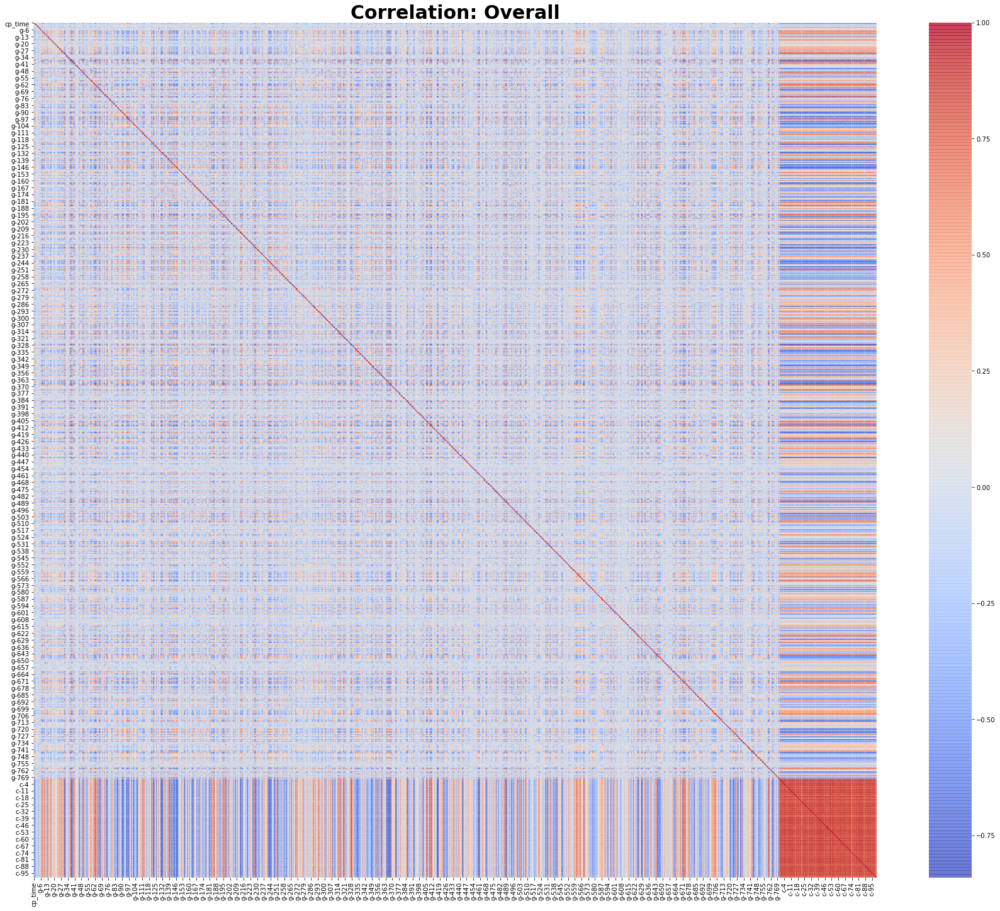

In [76]:
plt.figure(figsize=(30,25))
sns.heatmap(allcorrs,cmap='coolwarm',alpha=0.75)
plt.title('Correlation: Overall', fontsize=30, weight='bold')
plt.savefig("OverallCorrelations.png")

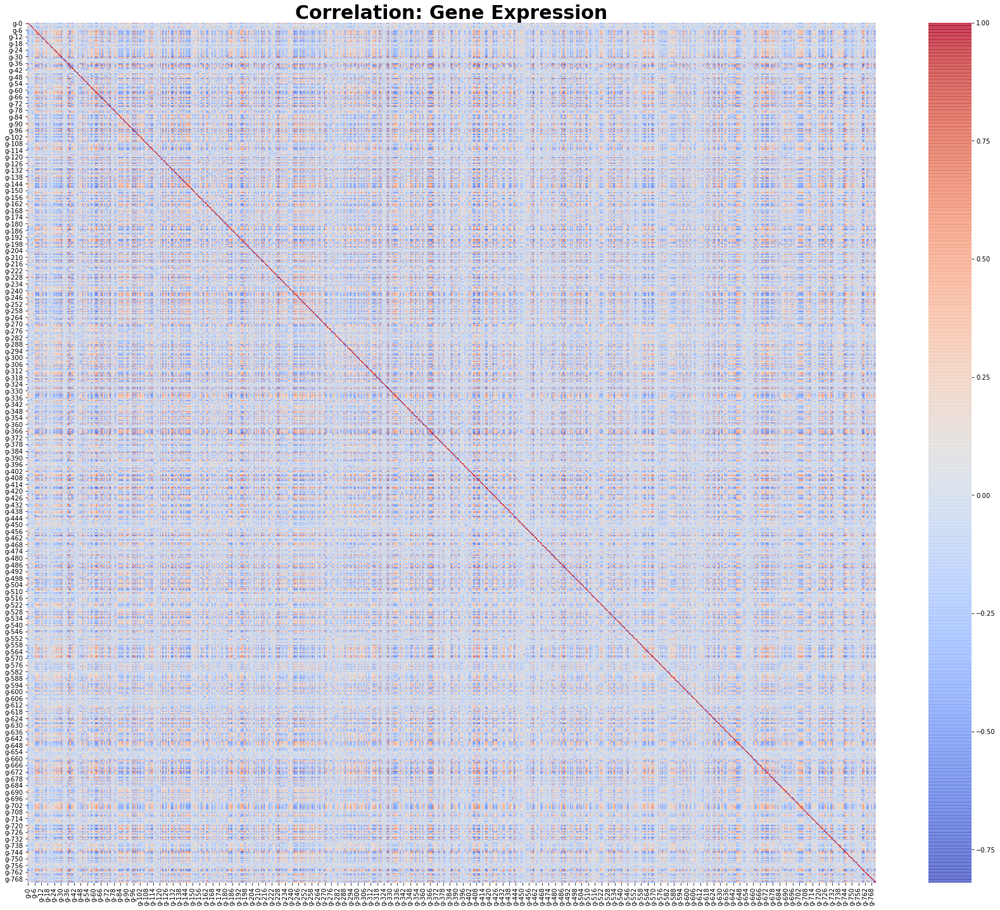

In [77]:
plt.figure(figsize=(30,25))
sns.heatmap(genescorr,cmap='coolwarm',alpha=0.75)
plt.title('Correlation: Gene Expression', fontsize=30, weight='bold')
plt.savefig("GeneCorrelations.png")

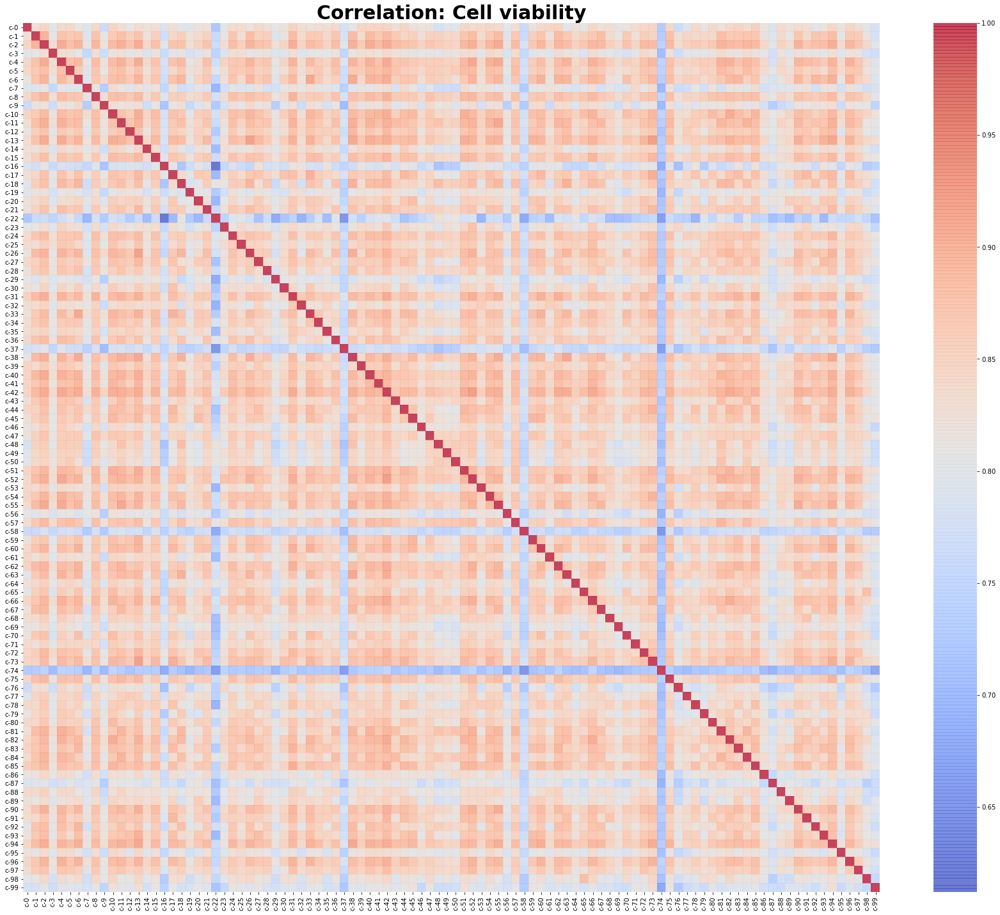

In [78]:
plt.figure(figsize=(30,25))
sns.heatmap(cellscorr,cmap='coolwarm',alpha=0.75)
plt.title('Correlation: Cell viability', fontsize=30, weight='bold')
plt.savefig("CellCorrelations.png")


### Preprocessing

Note the data comes in primarily clean thus only need to concern categorical variables to dummy variables for the classification tasks -  'cp_type', 'cp_time' and 'cp_dose. Normalize dataset via standardization

In [79]:
columnTransformer = ColumnTransformer([('encoder', OneHotEncoder(handle_unknown = 'ignore'), ['cp_type', 'cp_time', 'cp_dose'])], remainder='passthrough').fit(x_train)

x_train = columnTransformer.transform(x_train)
x_test = columnTransformer.transform(x_test)

In [80]:
scaler = StandardScaler(with_mean=False).fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [81]:
y_train = y_train.to_numpy()

In [82]:
pca = TruncatedSVD(n_components = 15, n_iter=5)
pca.fit(x_train)
pca_var = sum(pca.explained_variance_ratio_)
print(pca_var)

0.521499710284504


In [83]:
x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)

###  MLA
#KNN
#RidgeClassifier

In [85]:
label_estimator_list = list()

In [144]:
#Is an example of using the pipeline
#model = Pipeline([('clf', MultiOutputClassifier(RidgeClassifier()))])
# dict_param = [{'estimator': Pipeline([('clf', MultiOutputClassifier(LinearSVC()))]), 'grid_param':{'clf__estimator__C':[0.1]}}]
 
#parameters = {'clf__estimator__alpha': [1]}
#gs_clf_ridge = GridSearchCV(model, parameters, verbose = 1, cv = 5)
#gs_clf_ridge = gs_clf_ridge.fit(x_train_pca, y_train)
#print(gs_clf_ridge.best_score_)
#print(gs_clf_ridge.best_params_)
#print(gs_clf_ridge.best_estimator_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    6.2s finished


0.4227345077284892
{'clf__estimator__alpha': 1}
Pipeline(steps=[('clf',
                 MultiOutputClassifier(estimator=RidgeClassifier(alpha=1)))])


In [88]:
#Must be in format [{'estimator': estimator_function(), grid_param:{}}]

dict_param = [{'estimator': Pipeline([('clf', MultiOutputClassifier(KNeighborsClassifier()))]), 'grid_param':{'clf__estimator__n_neighbors':[3,5,10]}},
              {'estimator': Pipeline([('clf', MultiOutputClassifier(RidgeClassifier()))]), 'grid_param':{'clf__estimator__alpha':[0.01,0.1,1,10,100]}}
             
             ]

In [89]:
def best_model(X_data, y_data, est_params):
    #est_params: dictionary composed of estimator string as the key and grid search paramater dictionary as value
    #param_griddict or list of dictionarie; Dictionary with parameters names (str) as keys and lists of parameter settings to try as values, or a list of such dictionaries, in which case the grids spanned by each dictionary in the list are explored. 
    #This enables searching over any sequence of parameter settings.Must be in format [{'estimator': estimator_function(), grid_param:{}}]
    best_model = None
    best_score = 0
    
    for group in est_params:
        estimator = group['estimator']
        param = group['grid_param']
        
        clf = GridSearchCV(estimator, param_grid = param, cv= 5, refit = True)
        clf.fit(X_data, y_data)
        clf_score = clf.best_score_
        clf_est = clf.best_estimator_
        clf_params = clf.best_params_
        
        print('Estimator {}, score {}'.format(estimator,clf_score))
        
        if clf_score > best_score:
            best_score = clf_score
            best_model = clf_est
            best_params = clf_params
            
    print('Grid search best score is {}'.format(best_score))
    print('Grid search best parameters are {}'.format(best_params))
    
    return best_model

In [90]:
final_model = best_model(x_train_pca, y_train, dict_param)

Estimator Pipeline(steps=[('clf',
                 MultiOutputClassifier(estimator=KNeighborsClassifier()))]), score 0.45448049384592826
Estimator Pipeline(steps=[('clf', MultiOutputClassifier(estimator=RidgeClassifier()))]), score 0.4227345077284892
Grid search best score is 0.45448049384592826


### Predictions

In [91]:
#predictions = pd.DataFrame(columns = y_columns)
#predictions['sig_id'] = sig_id
#predictions = predictions.set_index('sig_id')

In [92]:
#predictions.head()

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,...,tropomyosin_receptor_kinase_inhibitor,trpv_agonist,trpv_antagonist,tubulin_inhibitor,tyrosine_kinase_inhibitor,ubiquitin_specific_protease_inhibitor,vegfr_inhibitor,vitamin_b,vitamin_d_receptor_agonist,wnt_inhibitor
sig_id,,,,,,,,,,,,,,,,,,,,,
id_0004d9e33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
id_001897cda,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
id_002429b5b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
id_00276f245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
id_0027f1083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
predictions1 = final_model.predict(x_test_pca)

In [153]:
df1 = pd.DataFrame(predictions1)

In [154]:
df1.to_csv("final_predictions.csv")